In [55]:
import torch
import torch.nn as nn
from collections import OrderedDict
from typing import Dict, Any, NoReturn
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [87]:
from art import Net, create_input #, generate_one_art, generate_one_gallery

Override by subclassing previous Net class.

In [75]:
def generate_one_gallery(
    net_class,
    net_config: Dict[str, Any] = {
        "num_hidden_layers": 4,
        "num_neurons": 8,
        "include_bias": True,
    },
    input_config: Dict[str, Any] = {"img_width": 320, "img_height": 320},
) -> NoReturn:
    """
    Plots grid of 40 images, accepting net_config as dict containing parameters to Net constructor.
    From these images, the ones in a column are the same network but have their latent vector perturbed.

    Input
    -----
    net_config: dict
        Dict of parameters to be passed to `Net()` as kwargs.

    input_config: dict
        Dict of parameters to be passed to `create_input` through `generate_one_art` as kwargs.

    Output
    ------
    None
    """
    _, ax = plt.subplots(ncols=10, nrows=4, figsize=(16, 6))

    for i in range(10):
        net = net_class(**net_config)
        latent_vec = np.random.normal(size=(3,))

        for j in range(4):
            out = generate_one_art(
                net, latent_vec=latent_vec, input_config=input_config
            )
            latent_vec += 0.2

            # if (n, n, 1) output i.e. if grayscale
            if out.shape[2] == 1:
                img = Image.fromarray(
                    np.squeeze(out), mode="L"
                )  # Mode inference is automatic but better be explicit
                ax[j, i].imshow(img, cmap="gray")
            else:
                img = Image.fromarray(out, mode="RGB")
                ax[j, i].imshow(img, cmap="gray")

            ax[j, i].xaxis.set_visible(False)
            ax[j, i].yaxis.set_visible(False)

    plt.tight_layout()
    plt.show()

In [76]:
class CustomNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "tanh0": nn.Tanh(),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "tanh0": nn.Tanh(),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "tanh" + str(i + 1): nn.Tanh(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "tanh-output": nn.Tanh(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "tanh-output": nn.Tanh(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

In [77]:
net = CustomNet()

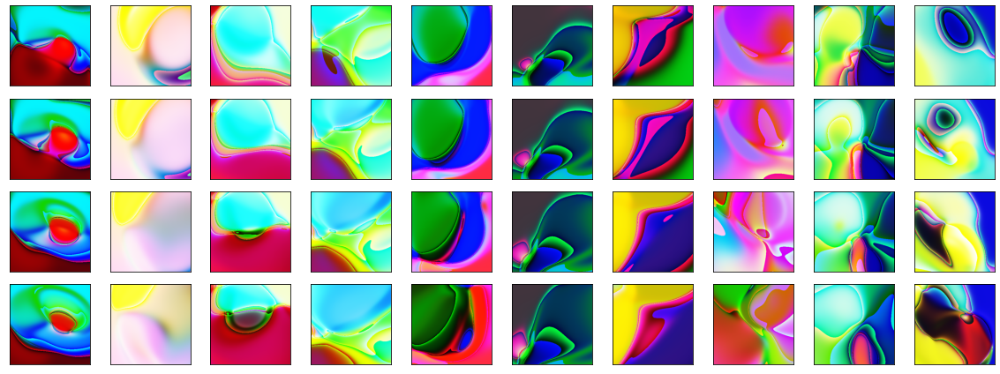

In [78]:
generate_one_gallery(CustomNet)

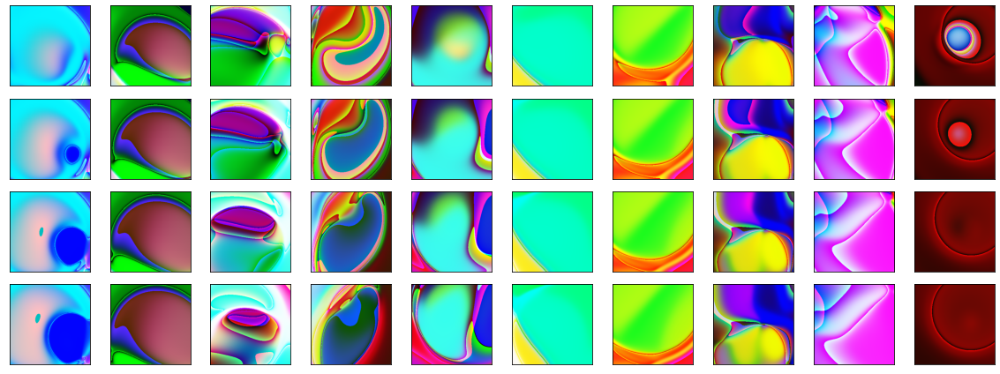

In [79]:
generate_one_gallery(CustomNet)

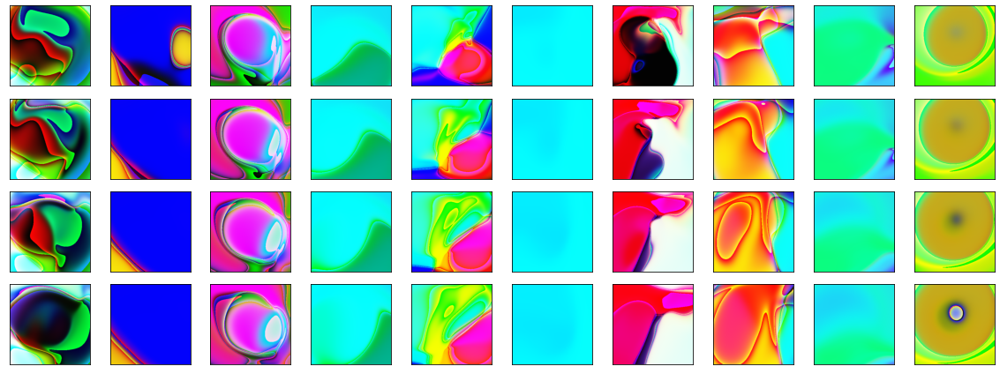

In [80]:
generate_one_gallery(CustomNet)

Inserting sigmoids into the net produce dull squares of colour. My guess is that it doesn't play well with the tanh activations. But replacing the final layer with tanh produces these ghastly beautiful images with sharper images vs tanh. Wonder why that is.

Guess has something to do with scaling the output 0 to 1 into 0 to 255 on unsigned int8.

In [83]:
x = np.linspace(-1, 1, 100)

In [84]:
y = x * 255
yint = y.astype(np.uint8)

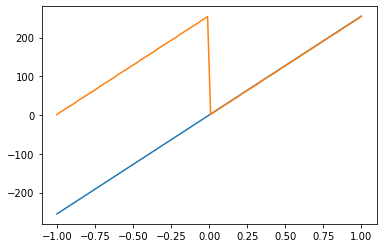

In [85]:
plt.plot(x, y)
plt.plot(x, yint)

Yup so interestingly using a tanh means that we have this odd conversion into 0 to 255. Explains the sharper colours since a larger range of output values are squeezed into a smaller range on RGB.

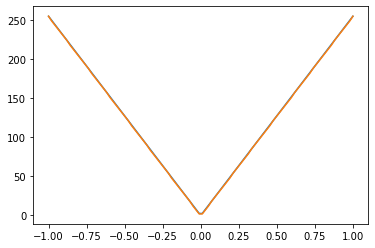

In [86]:
plt.plot(x, np.abs(y))
plt.plot(x, np.abs(y).astype(np.uint8))

Hmmm.

In [88]:
def generate_one_art(
    net: Net,
    latent_vec: torch.Tensor,
    input_config: Dict[str, Any] = {"img_width": 320, "img_height": 320},
) -> np.ndarray:

    # Create input to net, and convert from ndarray to torch.FloatTensor
    net_input = torch.tensor(create_input(**input_config)).float()

    # Create input array from latent_vec, and convert from ndarray to torch.FloatTensor
    latent_vec = np.expand_dims(latent_vec, axis=0)
    latent_vec = np.repeat(latent_vec, repeats=net_input.shape[0], axis=0)
    latent_vec = torch.tensor(latent_vec).float()

    assert net_input.shape == latent_vec.shape, (
        "Shape of net_input is "
        f"{net_input.shape} while shape of latent_vec is {latent_vec.shape}"
    )

    # Run input through net
    net_output = net(net_input, latent_vec).detach().numpy()

    # Reshape into (y, x, 3) for plotting in PIL
    net_output = net_output.reshape(
        input_config["img_height"], input_config["img_width"], -1
    )

    # Re-format to color output
    # Scale to range 0 to 255, and set type to int
    net_output = (net_output * 255)
    net_output = np.abs(net_output)
    net_output = net_output.astype(np.uint8)
    return net_output

This code chunk updates generate_one_gallery so that the output of the network is abs-val'ed.

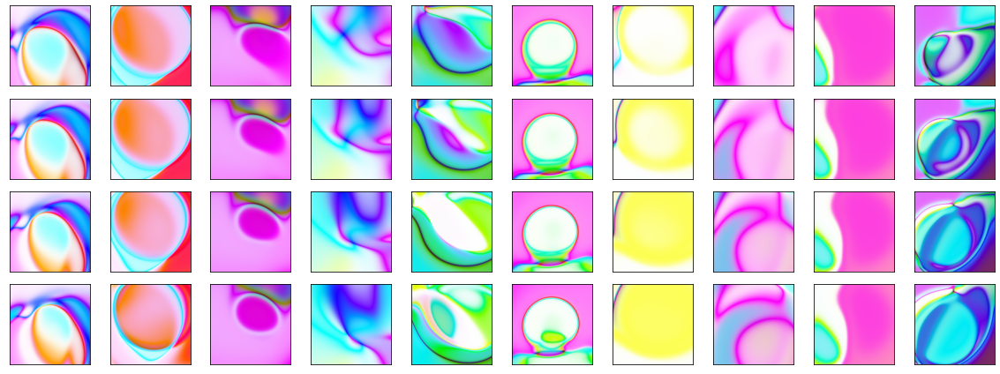

In [90]:
generate_one_gallery(CustomNet)

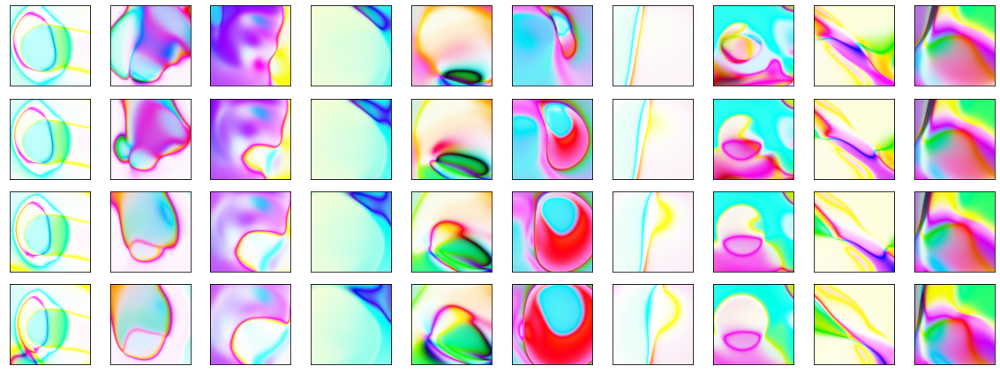

In [91]:
generate_one_gallery(CustomNet)

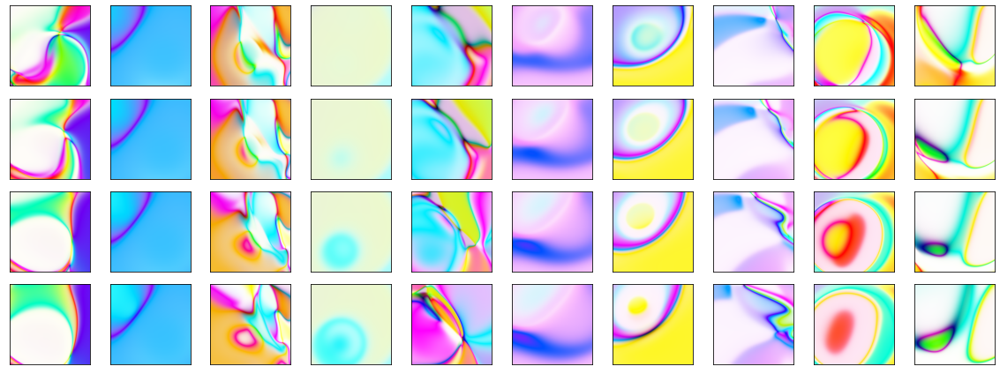

In [92]:
generate_one_gallery(CustomNet)

There is much more white in these images, signifying that the pixel intensities trend high. Surmised that the output values are far off from center, thus making whites likely. Previous activation sees black in the middle and at the end, thus making black more prominent. Pleasantly surprised to see this!

Mmmm like the one with black streaks more. 

Going by this concept, it is possible to squeeze in more of these mapping segments by toying with the outputs and taking advantage of the overflow property of ints:

In [98]:
def generate_one_art(
    net: Net,
    latent_vec: torch.Tensor,
    input_config: Dict[str, Any] = {"img_width": 320, "img_height": 320},
) -> np.ndarray:

    # Create input to net, and convert from ndarray to torch.FloatTensor
    net_input = torch.tensor(create_input(**input_config)).float()

    # Create input array from latent_vec, and convert from ndarray to torch.FloatTensor
    latent_vec = np.expand_dims(latent_vec, axis=0)
    latent_vec = np.repeat(latent_vec, repeats=net_input.shape[0], axis=0)
    latent_vec = torch.tensor(latent_vec).float()

    assert net_input.shape == latent_vec.shape, (
        "Shape of net_input is "
        f"{net_input.shape} while shape of latent_vec is {latent_vec.shape}"
    )

    # Run input through net
    net_output = net(net_input, latent_vec).detach().numpy()

    # Reshape into (y, x, 3) for plotting in PIL
    net_output = net_output.reshape(
        input_config["img_height"], input_config["img_width"], -1
    )

    # Re-format to color output
    # Scale to range 0 to 255, and set type to int
    multiplier = 2
    net_output = net_output * multiplier
    net_output = (net_output * 255)
    # net_output = np.abs(net_output)
    net_output = net_output.astype(np.uint8)
    return net_output

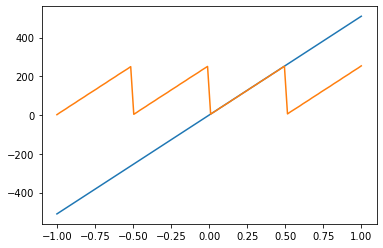

In [99]:
y = 2 * y
plt.plot(x, y)
plt.plot(x, y.astype(np.uint8))

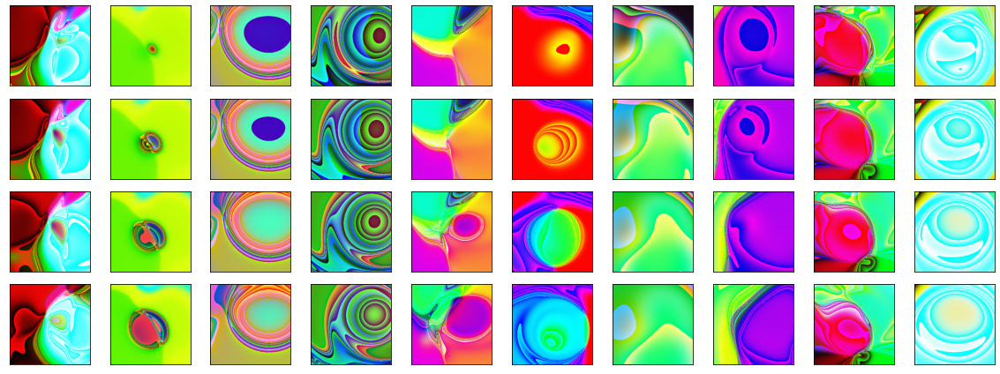

In [100]:
generate_one_gallery(CustomNet)

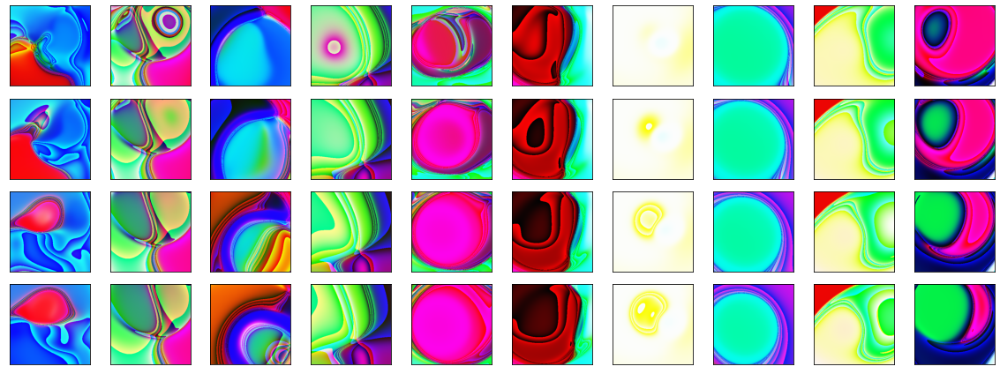

In [101]:
generate_one_gallery(CustomNet)

This is pretty wild. Sharper lines, more weird shapes. Thought the sharp cutoff in the mapping would lead to weird discontinuities, but I like what I'm seeing here so far. From this, also learning that the biggest impact on the output is in the final layer (duh). 

Before I get to the other thoughts that came up, going to trying an all-sigmoid net first to see if we should continue spending time with sigmoids.

Setting generate_one_art back to normal:

In [102]:
def generate_one_art(
    net: Net,
    latent_vec: torch.Tensor,
    input_config: Dict[str, Any] = {"img_width": 320, "img_height": 320},
) -> np.ndarray:
    """
    Wrapper function to generate a single image output from the given network.

    Input
    -----
    net: Net
    latent_vec: torch.Tensor
    input_config: dict
        Dict of parameters to be passed to `create_input` as kwargs.

    Output
    ------
    net_output: np.ndarray
        Should have shape (y, x, 3) or (y, x, 1)
    """
    # Create input to net, and convert from ndarray to torch.FloatTensor
    net_input = torch.tensor(create_input(**input_config)).float()

    # Create input array from latent_vec, and convert from ndarray to torch.FloatTensor
    latent_vec = np.expand_dims(latent_vec, axis=0)
    latent_vec = np.repeat(latent_vec, repeats=net_input.shape[0], axis=0)
    latent_vec = torch.tensor(latent_vec).float()

    assert net_input.shape == latent_vec.shape, (
        "Shape of net_input is "
        f"{net_input.shape} while shape of latent_vec is {latent_vec.shape}"
    )

    # Run input through net
    net_output = net(net_input, latent_vec).detach().numpy()

    # Reshape into (y, x, 3) for plotting in PIL
    net_output = net_output.reshape(
        input_config["img_height"], input_config["img_width"], -1
    )

    # Re-format to color output
    # Scale to range 0 to 255, and set type to int
    net_output = (net_output * 255).astype(np.uint8)
    return net_output

In [106]:
class SigmoidNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "sigmoid0": nn.Sigmoid(),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "sigmoid0": nn.Sigmoid(),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "sigmoid" + str(i + 1): nn.Sigmoid(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

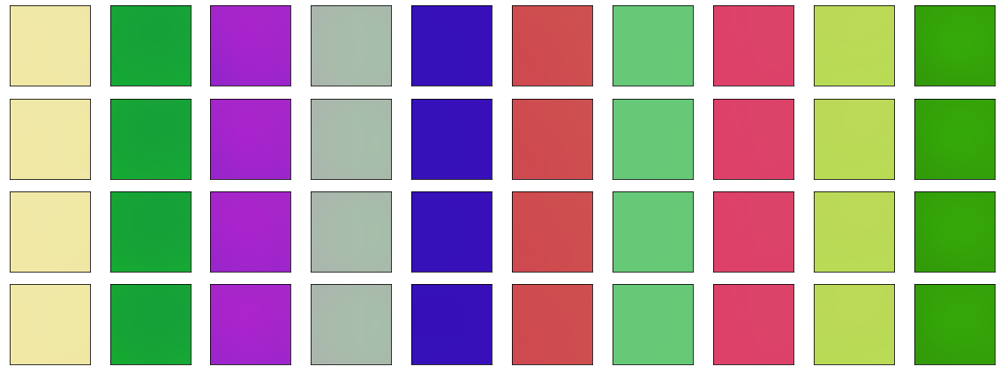

In [107]:
generate_one_gallery(SigmoidNet)

The more sigmoid layers I pile in, the more monotone the colours are. Probably has to do with how the weights are initialized as well. In that case, tanh behaviour is sufficient for me, no need to bother more w/ sigmoids.

In [113]:
class Sine(nn.Module):
    def __init__(self, multiplier=1, bias=0):
        super().__init__()
        self.multiplier = multiplier
        self.bias = bias
        
    def forward(self, x):
        return torch.sin(self.multiplier * x + self.bias)

This should be fun.

In [127]:
class SineNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "sine0": Sine(multiplier=6),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "sine0": Sine(multiplier=6),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "tanh" + str(i + 1): nn.Tanh(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

The following are just using sine activation on the input:

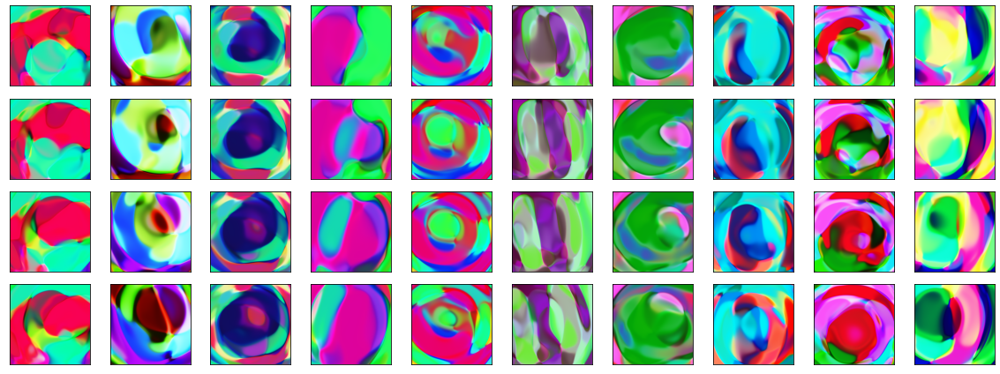

In [118]:
# Multiplier 2
generate_one_gallery(SineNet)

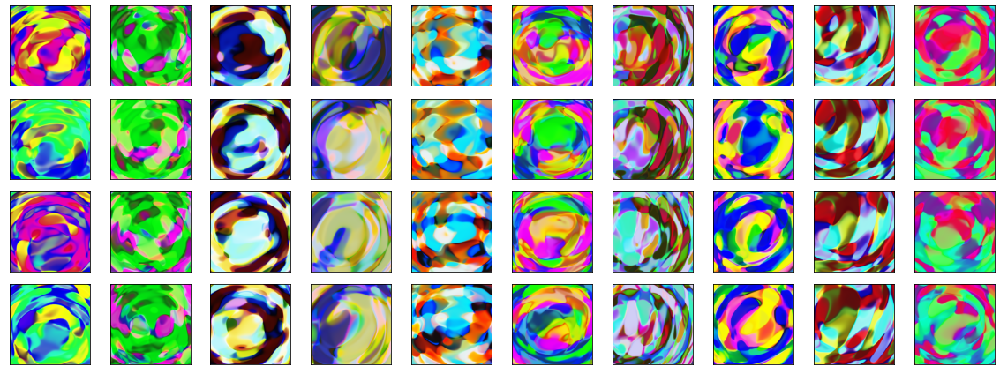

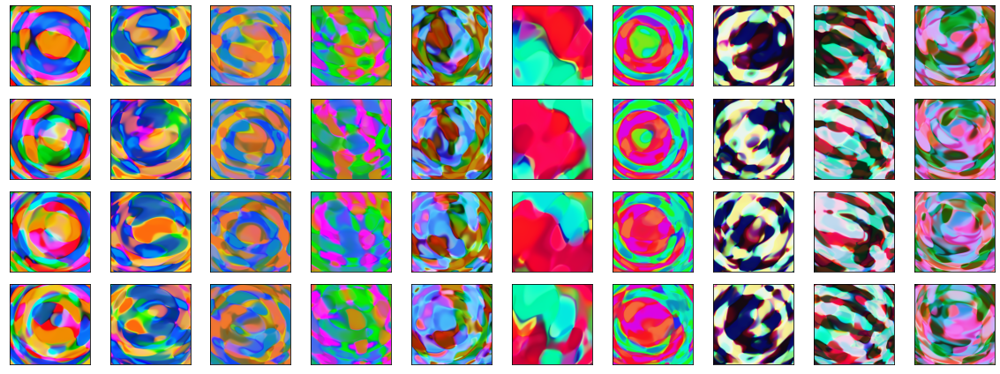

In [122]:
# Multiplier 4
generate_one_gallery(SineNet)
generate_one_gallery(SineNet)

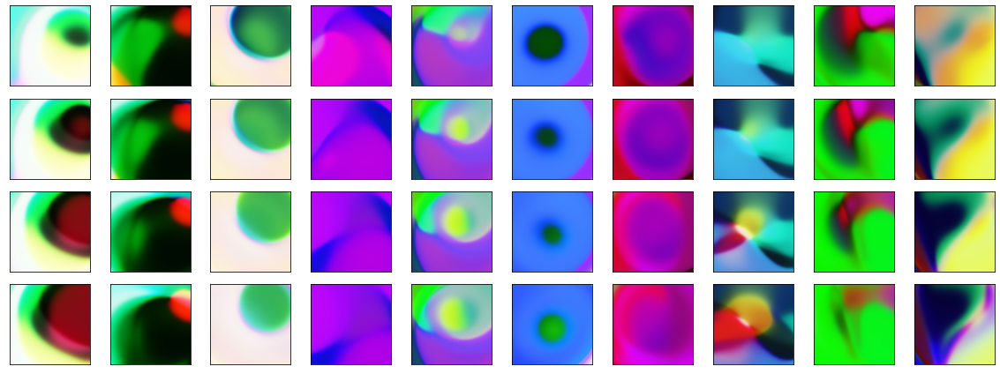

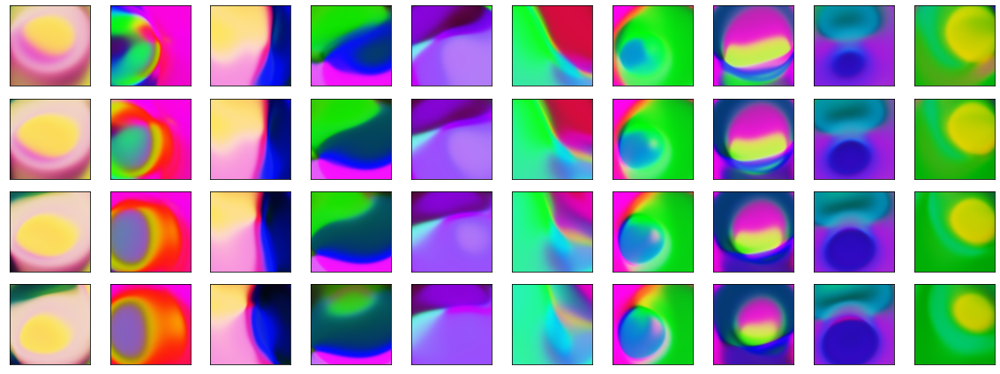

In [124]:
# Multiplier 0.5
generate_one_gallery(SineNet)
generate_one_gallery(SineNet)

Cranking up the sine multiplier "agitates" the image (feel like using artsy terms), while dropping the sine multiplier "loosens" the image. Have to note that this appears similar to the effect of stacking more layers onto the network.

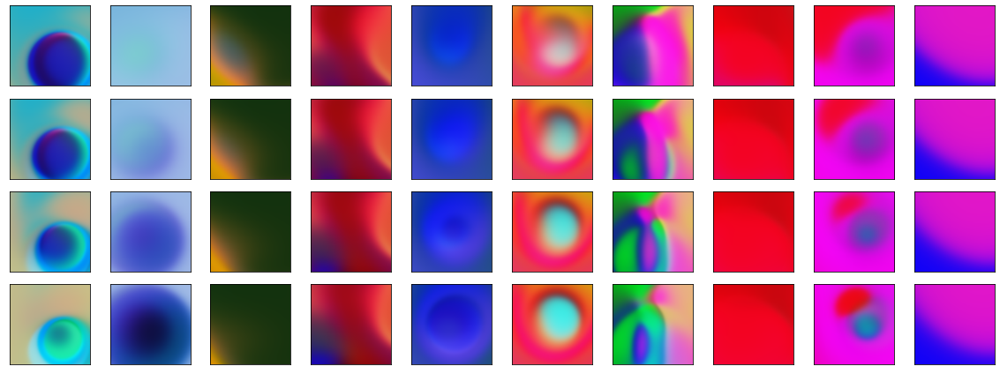

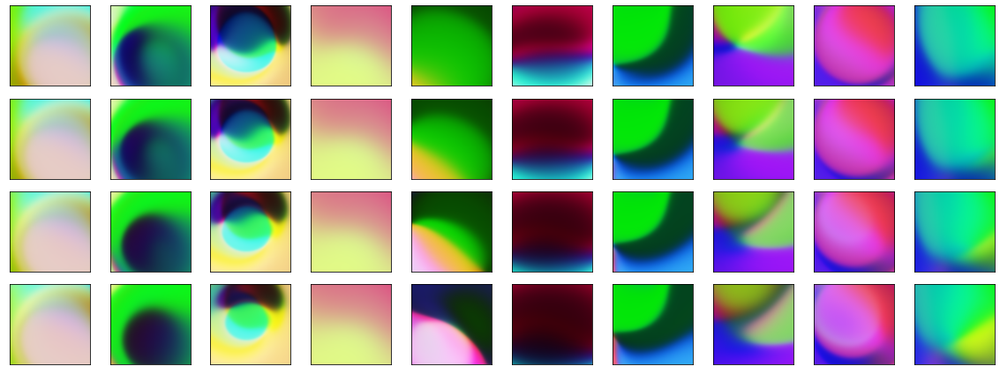

In [126]:
# Multiplier 1/6
generate_one_gallery(SineNet)
generate_one_gallery(SineNet)

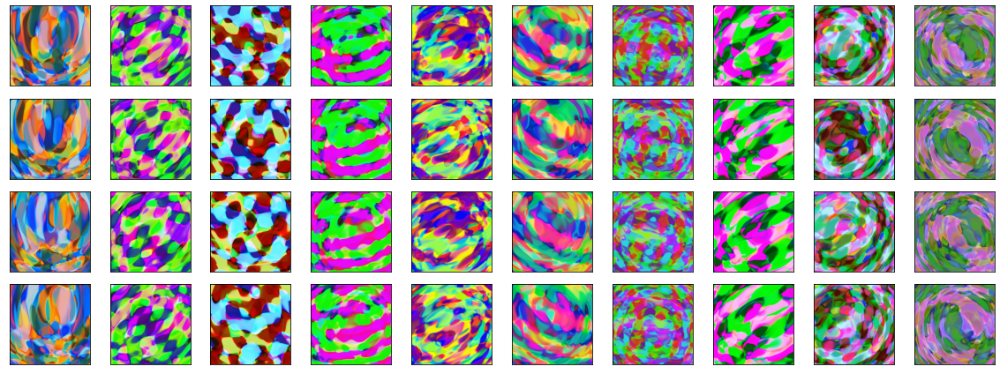

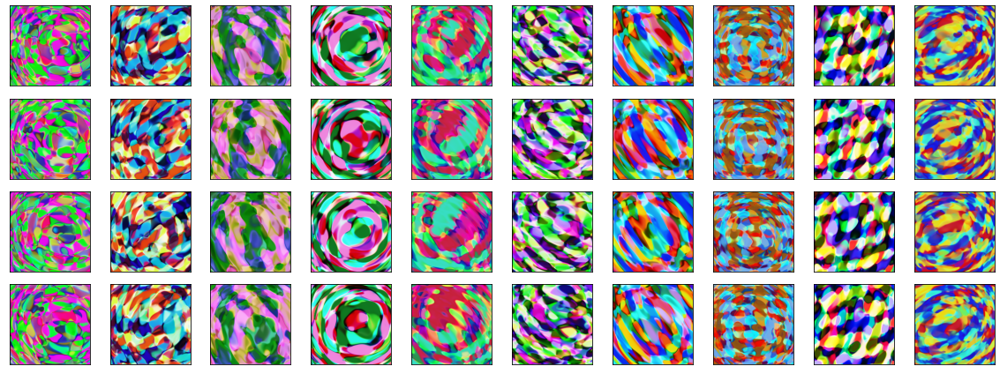

In [128]:
# Multiplier 6
generate_one_gallery(SineNet)
generate_one_gallery(SineNet)

Cranking up the sine multiplier too much causes images to adopt a checkerboad pattern as different portions of the image loop on itself. Fundamentally, putting a sine activation after the first layer effectively repeats mirrored segments of the input. Probably not so much a good idea, unless we are venturing far from the input space and other activations would give us plateaued values otherwise.

In [129]:
class SineNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "sine0": Sine(multiplier=1),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "sine0": Sine(multiplier=1),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "sine" + str(i + 1): Sine(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

Using sine for the hidden layers:

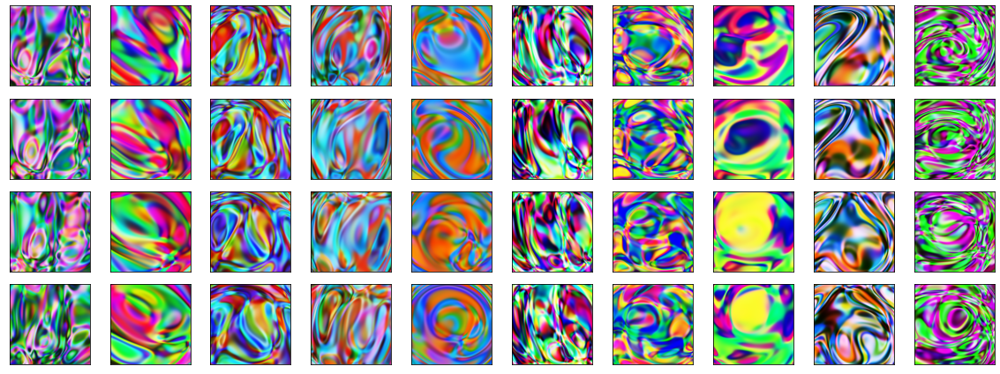

In [131]:
generate_one_gallery(SineNet)

Hmm okay this is a bit too frantic. Not a good idea to have sines mapped onto sines.

In [145]:
class SineNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "sine0": nn.Tanh(),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "sine0": nn.Tanh()
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "tanh" + str(i + 1): nn.Tanh(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sine-output": Sine(multiplier=1/10),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sine-output": Sine(multiplier=1/10),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

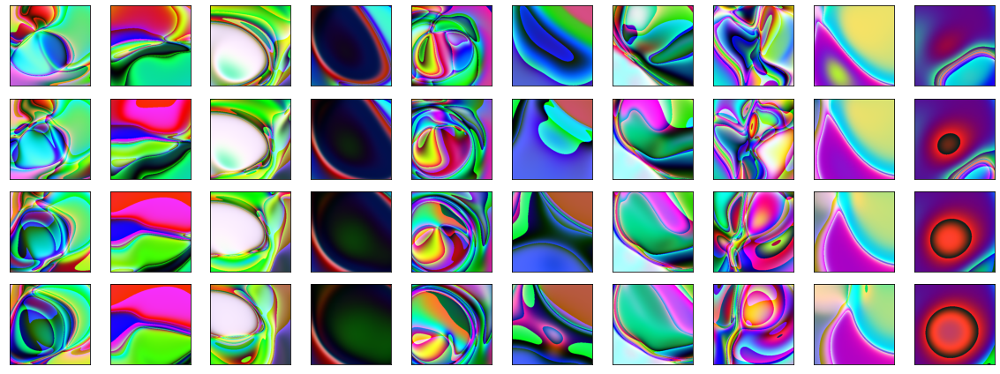

In [136]:
generate_one_gallery(SineNet)

Sine output has the same effect as the tanh output earlier, except that this is probably more graceful. Keeping in mind that the int overflow here is causing the output to have the same behaviour as tanh mapping plotted somewhere up there.

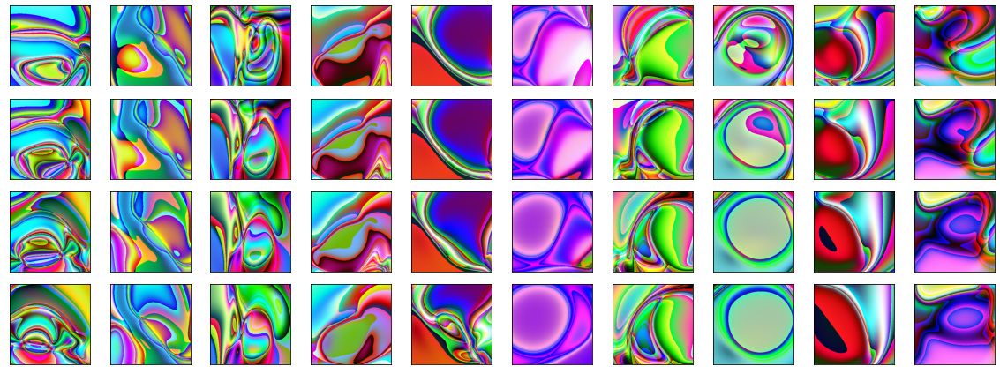

In [138]:
# Multiplier 2
generate_one_gallery(SineNet)

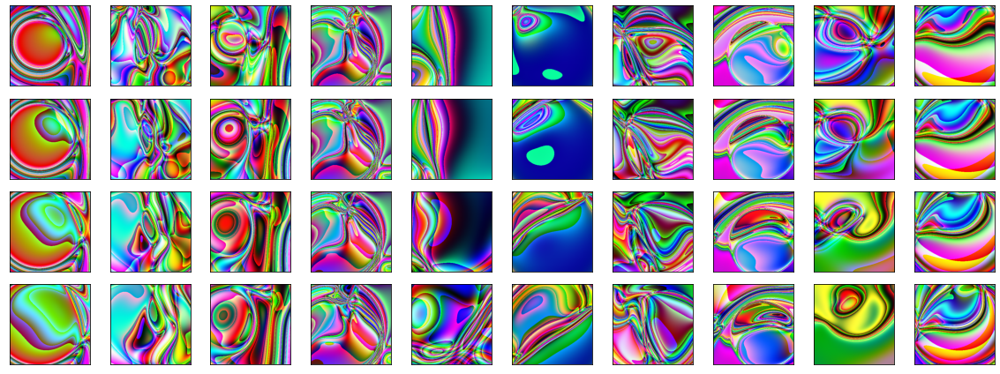

In [140]:
# Multiplier 4
generate_one_gallery(SineNet)

Like before, high multiplier here makes the images queasy to look at.

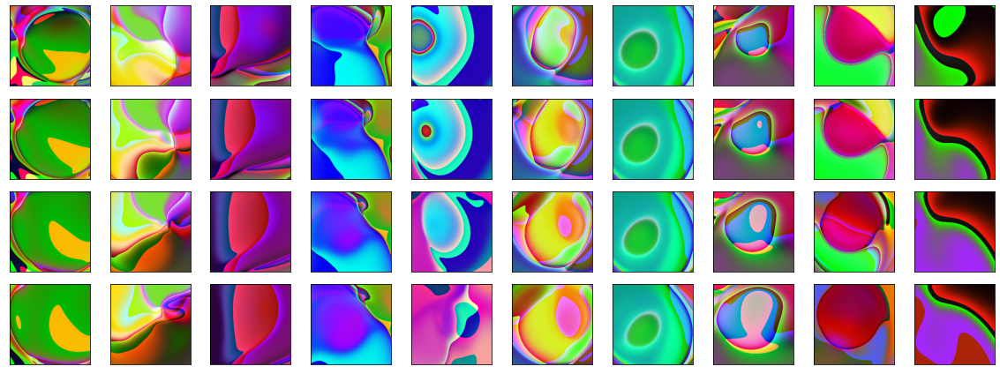

In [142]:
# Multiplier 1/2
generate_one_gallery(SineNet)

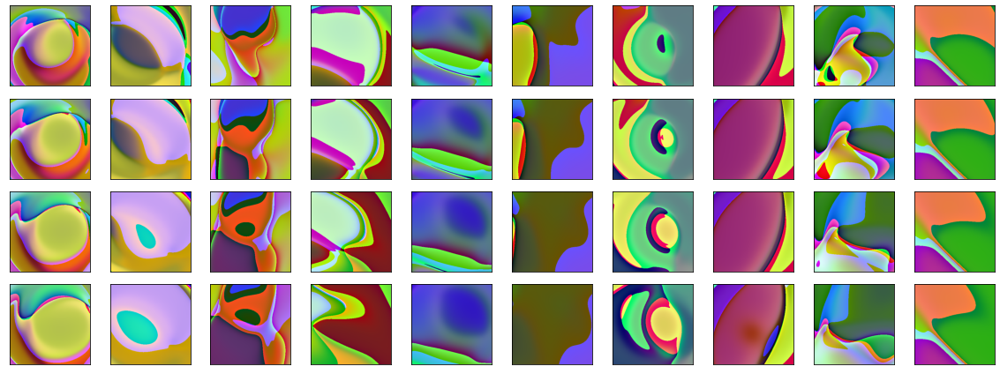

In [144]:
# Multiplier 1/6
generate_one_gallery(SineNet)

Relaxing the sine multiplier here actually allows mapping the outputs to some smooth and interesting images hmmm.

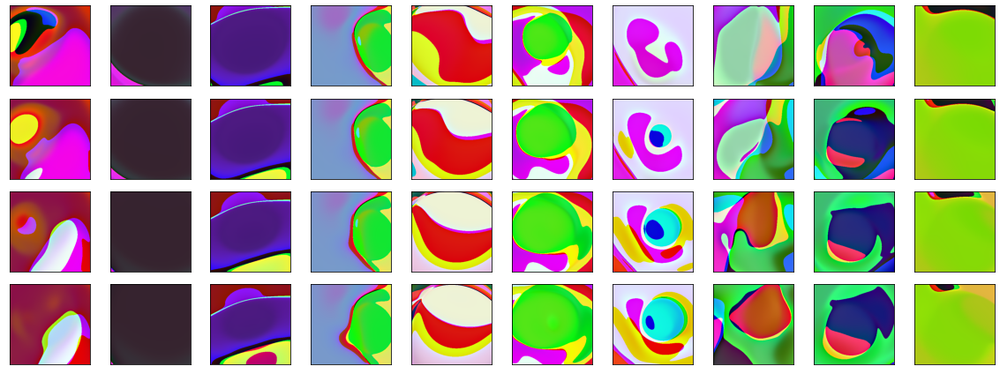

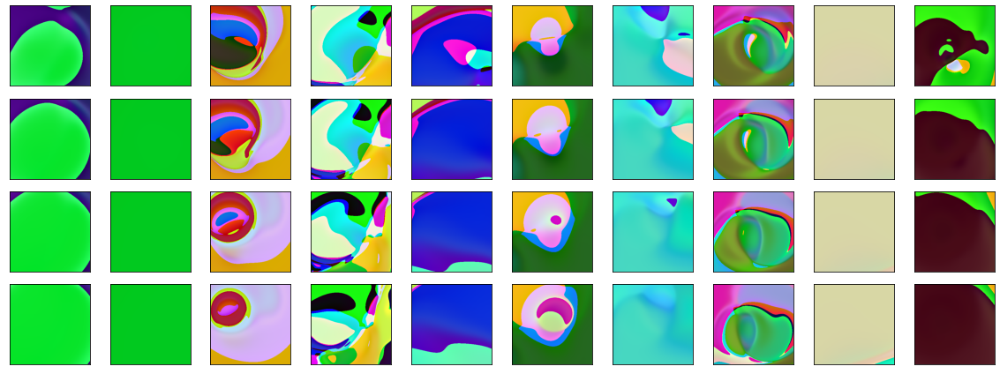

In [147]:
# Multiplier 1/10
generate_one_gallery(SineNet)
generate_one_gallery(SineNet)

Might have overdone it a bit with 1/10 but definitely seeing some nice abstract shapes here.

Okay so conclusion from testing these layers:
+ Sigmoid mostly ineffectual since the network init is geared for tanh output centered at 0. Overall both have similar behaviour so we can just skip sigmoid.
+ Tanh output is interesting because it maps the outputs into the RGB range twice. Possible to introduce multipliers on the output to repeat the mapping a couple of times.
+ Sine as activation in hidden layers dont work well, can serve a bounding purpose for input as long as the input multiplier is not too high, same goes for output.

How about relu input?

In [153]:
class ReLUNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "relu0": nn.ReLU(),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "relu0": nn.ReLU()
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "tanh" + str(i + 1): nn.Tanh(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

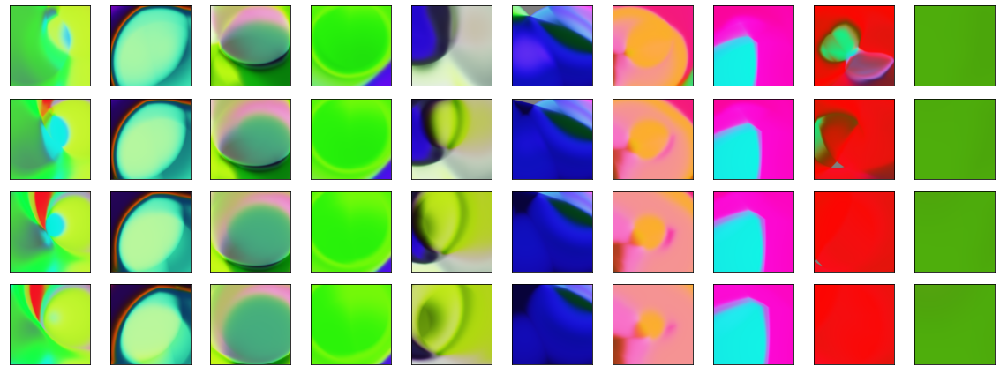

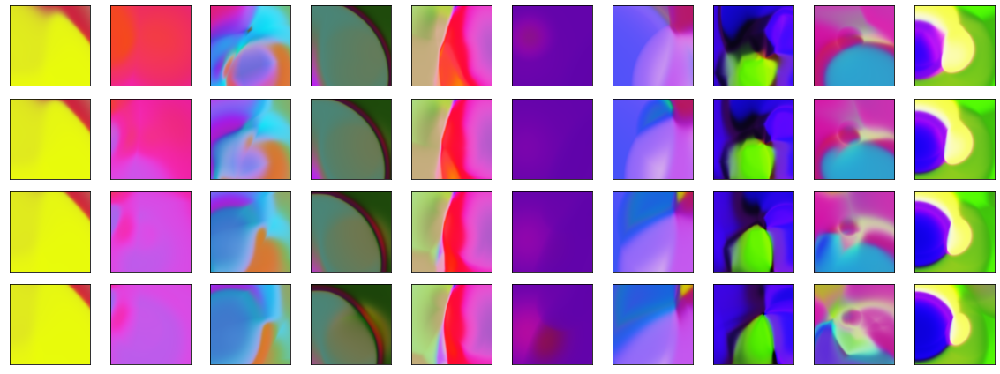

In [157]:
generate_one_gallery(ReLUNet)
generate_one_gallery(ReLUNet)

Relu should zero out the inputs to the next layer. By observation, this means that the images are more placid.

Wonder how these norm layers would work.

In [162]:
class LayerNormNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    # "tanh0": nn.Tanh(),
                    "layernorm0": nn.LayerNorm(num_neurons),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    # "tanh0": nn.Tanh()
                    "layernorm0": nn.LayerNorm(num_neurons),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "tanh" + str(i + 1): nn.Tanh(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

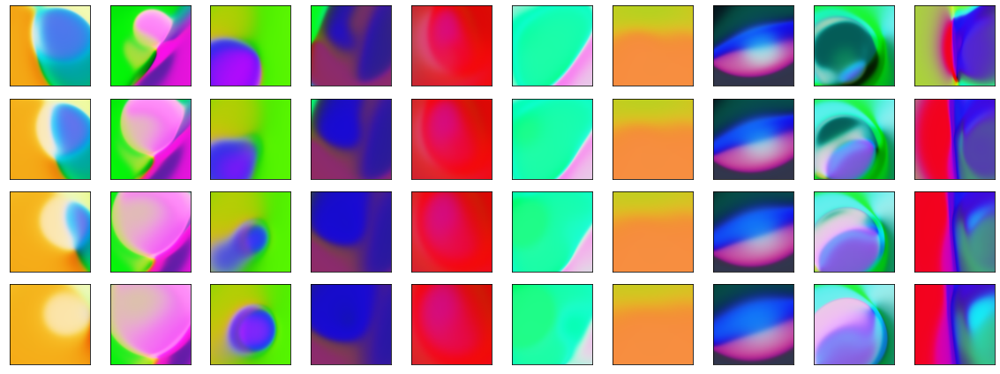

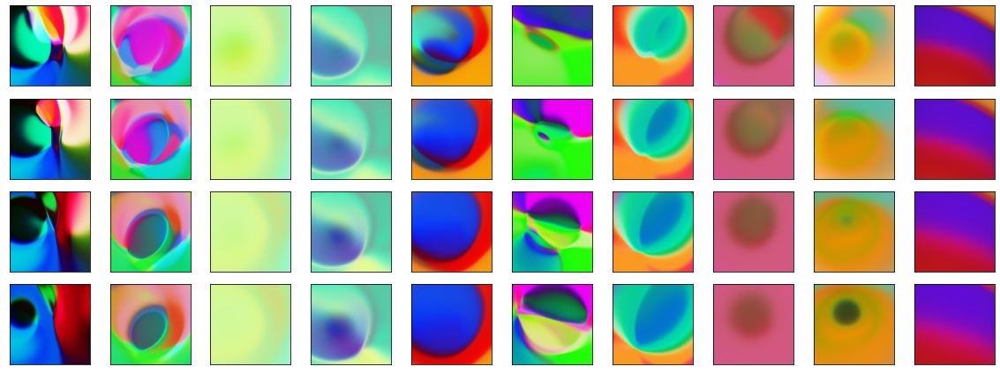

In [164]:
generate_one_gallery(LayerNormNet)
generate_one_gallery(LayerNormNet)

Can't see the effect of LayerNorm at this point in time, but definitely has some element of smoothing here. 

In [167]:
class LayerNormSineNet(Net):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        
    def init_arch(
        self,
        num_hidden_layers,
        num_neurons,
        latent_len,
        include_bias,
        include_dist_to_origin,
        rgb,
    ) -> nn.Sequential:
        layers = OrderedDict()

        # Input layer
        if include_dist_to_origin:
            layers.update(
                {
                    "fc0": nn.Linear(3 + latent_len, num_neurons, bias=include_bias),
                    "tanh0": nn.Tanh(),
                    # "layernorm0": nn.LayerNorm(num_neurons),
                }
            )

        else:
            layers.update(
                {
                    "fc0": nn.Linear(2 + latent_len, num_neurons, bias=include_bias),
                    "tanh0": nn.Tanh()
                    # "layernorm0": nn.LayerNorm(num_neurons),
                }
            )

        # Hidden layers
        for i in range(num_hidden_layers):
            layers.update(
                {
                    "fc" + str(i + 1): nn.Linear(num_neurons, num_neurons, bias=False),
                    "sine" + str(i + 1): Sine(),
                }
            )

        # Output layer
        if rgb:
            layers.update(
                {
                    "layernorm" + str(i+1): nn.LayerNorm(num_neurons),
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 3, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )
        else:
            layers.update(
                {
                    "layernorm" + str(i+1): nn.LayerNorm(num_neurons),
                    "fc" + str(i + 1 + 1): nn.Linear(num_neurons, 1, bias=False),
                    "sigmoid-output": nn.Sigmoid(),
                }
            )

        # Assign layers to self.layers
        return nn.Sequential(layers)

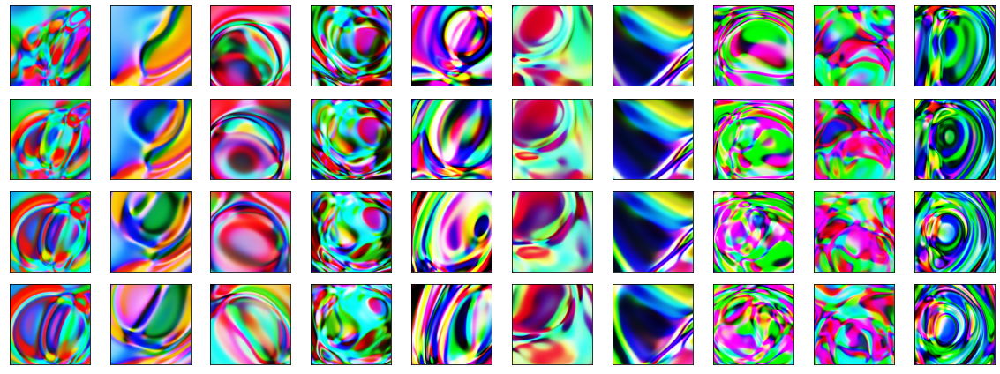

In [168]:
generate_one_gallery(LayerNormSineNet)

Hmm these colours are much more primary colours than anything else. Don't know what effect this is called though.